In [1]:
#Import Libraries
import pandas as pd
import numpy as np
import itertools
from numpy import arange
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from scipy.misc import toimage
import sklearn
import time
import os
import copy
import PIL
from PIL import Image
import warnings
warnings.filterwarnings('ignore')
import cv2
from imutils import contours
from skimage import measure
import argparse
import imutils
from scipy import ndimage, misc
import re
import glob
from PIL import ImageFilter
from os import listdir
from os.path import isfile, join
import torch
from torch import Tensor
from torch.autograd import Variable
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn as nn
from torch.nn import Parameter
import torch.nn.functional as F
from torch.utils.model_zoo import load_url
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets, models
plt.ion() # Interactive mode
%matplotlib inline

In [2]:
############### Classification ###############

In [3]:
# Data augmentation and normalization for training data set
# Just normalization for validation data set
data_transforms = {
    'train': transforms.Compose([transforms.Resize(224), transforms.RandomCrop(224), transforms.RandomHorizontalFlip(), transforms.ToTensor(), transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])]),
    'val': transforms.Compose([transforms.Resize(224), transforms.CenterCrop(224), transforms.ToTensor(), transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
}

data_dir = 'final_dataset'

# Create dataset class 
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),data_transforms[x]) for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'val']}
# Obtain dataset sizes for training and validation set
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
# Obtain class names
class_names = image_datasets['train'].classes

use_gpu = torch.cuda.is_available()

In [4]:
print(dataset_sizes, class_names)
print(image_datasets)

{'train': 640, 'val': 160} ['Doctor', 'Nurse']
{'train': Dataset ImageFolder
    Number of datapoints: 640
    Root Location: final_dataset/train
    Transforms (if any): Compose(
                             Resize(size=224, interpolation=PIL.Image.BILINEAR)
                             RandomCrop(size=(224, 224), padding=None)
                             RandomHorizontalFlip(p=0.5)
                             ToTensor()
                             Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                         )
    Target Transforms (if any): None, 'val': Dataset ImageFolder
    Number of datapoints: 160
    Root Location: final_dataset/val
    Transforms (if any): Compose(
                             Resize(size=224, interpolation=PIL.Image.BILINEAR)
                             CenterCrop(size=(224, 224))
                             ToTensor()
                             Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
              

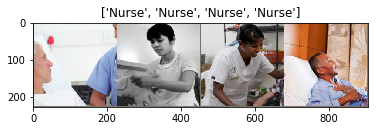

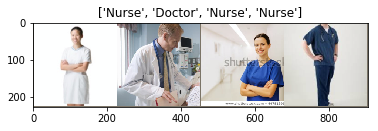

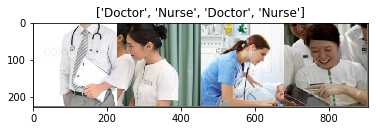

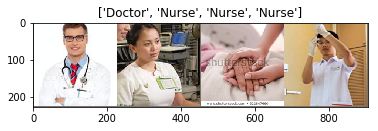

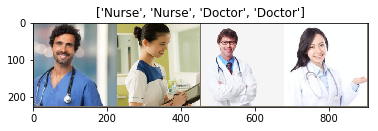

In [5]:
# Show some training images
def imshow(inp, title=None):
    '''Imshow for Tensor'''
    inp = inp.numpy().transpose((1,2,0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated

# Plot grid for 5 rows
for i in range(5):
    # Get a batch of training data (4 per batch)
    inputs, classes = next(iter(dataloaders['train']))

    # Make a grid of training data
    out = torchvision.utils.make_grid(inputs)

    imshow(out, title=[class_names[x] for x in classes])
    i += 1

In [6]:
Epochs = []
Training = []
Validation = []
Tr_loss = []
Valid_loss = []

def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 10)
        Epochs.append(epoch)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train(True)  # Set model to training mode
            else:
                model.train(False)  # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for data in dataloaders[phase]:
                # Get the inputs
                inputs, labels = data

                # Wrap them in Variable
                if use_gpu:
                    inputs = Variable(inputs.cuda())
                    labels = Variable(labels.cuda())
                else:
                    inputs, labels = Variable(inputs), Variable(labels)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward pass, obtain ouputs and compute loss
                outputs = model(inputs)
                _, preds = torch.max(outputs.data, 1)
                loss = criterion(outputs, labels)

                # Backward pass, compute gradient, update parameters only if in training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

                # Statistics
                running_loss += loss.data * inputs.size(0)
                
                #acc = torch.sum(prediction == labels.data).float() / number_of_examples * 100
                
                running_corrects += torch.sum(preds == labels.data).float()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects / dataset_sizes[phase]
            
            if phase == 'train':
                Training.append(epoch_acc*100)
                Tr_loss.append(epoch_loss)
            else:
                Validation.append(epoch_acc*100)
                Valid_loss.append(epoch_loss)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # Deep copy and save the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(model.state_dict(), "HCW_wts")
                
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))
    
    # Load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [7]:
# Instantiate model class and freeze weights of all layers
model_conv = torchvision.models.resnet18(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = False
    
# Create final layer as a fully connected layer with inputs 512 and output 3.
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)
# Load previously saved weights from training

print(model_conv.fc)

if use_gpu:
    model_conv = model_conv.cuda()
    
criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optmized.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

Linear(in_features=512, out_features=2, bias=True)


In [ ]:
model_conv = train_model(model_conv, criterion, optimizer_conv, exp_lr_scheduler, num_epochs=25)

In [8]:
# Plot training, validation accuracy graph vs epoch runs
def plot_training(Epochs, Training, Validation):    
    plt.figure(figsize=(12,6))
    plt.plot(Epochs, Training, label='Training')
    plt.plot(Epochs, Validation, label='Validation')
    plt.title("SGD Training and Validation Accuracy, Lr=0.001, Mo=0.9, Decay=7", fontsize=16)
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy(%)")
    plt.ylim(0,100)
    plt.legend(loc='best')
    plt.show()

In [9]:
# Plot training, validation loss graph vs epoch runs
def plot_loss(Epochs, Tr_loss, Valid_loss):    
    plt.figure(figsize=(12,6))
    plt.plot(Epochs, Tr_loss, label='Training')
    plt.plot(Epochs, Valid_loss, label='Validation')
    plt.title("SGD Training and Validation Loss, Lr=0.001, Mo=0.9, Decay=7", fontsize=20)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend(loc='best')
    plt.show()

In [ ]:
plot_training(Epochs, Training, Validation)

In [ ]:
plot_loss(Epochs, Tr_loss, Valid_loss)

In [ ]:
# Save model 
#torch.save(model_conv, 'model_best_results')

In [10]:
# Load model to resume or perform predictions
model_conv = torch.load('model_best_results')

In [11]:
label = []
predictions = []
merged_probs = []
images = []

for i, data in enumerate(dataloaders['val']):
    inputs, labels = data
    if use_gpu:
        inputs, labels = Variable(inputs.cuda()), Variable(labels.cuda())
    else:
        inputs, labels = Variable(inputs), Variable(labels)
        
    outputs = model_conv(inputs)
    # Activation and prediction for each image 
    _, preds = torch.max(outputs.data, 1)
    
    # Extract labels into a list
    labels = labels.data.cpu().numpy()
    label.append(labels)
    merged_labels = np.array(list(itertools.chain(*label)))
    
    # Extract predictions into a list
    preds = preds.numpy()
    predictions.append(preds)
    merged_preds = np.array(list(itertools.chain(*predictions)))
                           
    # Extract probabilities into a list
    x = torch.nn.functional.softmax(outputs)
    probs = x.data.cpu().numpy()
    for batch in probs:
        merged_probs.append(max(batch))
    
    # Extract dataset of images in Tensor format
    inputs = inputs.data.cpu().numpy()
    images.append(inputs)
    merged_ds = np.array(list(itertools.chain(*images)))

In [12]:
# Returns indices of x random filtered values from list
def rand_by_mask(mask): return np.random.choice(np.where(mask)[0], 6, replace=False)
def rand_by_correct(is_correct): return rand_by_mask((merged_preds == merged_labels) == is_correct)

In [13]:
def load_img_id(ds, idx): return np.array(toimage(ds[idx]))

# Plot 8 rows by 5 images subplot
def plots(ims, figsize=(16,40), rows=8, titles=None, axis=1):
    f = plt.figure(figsize=figsize)
    for i in range(len(ims)):
        ax = f.add_subplot(8,5,i+1)
        #ax.axis('Off')
        if titles is not None: ax.set_title("Prob:{:.4f}".format(titles[i], fontsize=12))
        if axis is not None: ax.set_xlabel("Pred:{}".format(class_names[axis[i]]), fontsize=12)
        plt.imshow(ims[i])

In [14]:
def plot_val_with_title(idxs, title):
    print(title)
    imgs = np.stack([load_img_id(merged_ds,x) for x in idxs])
    title_probs = [merged_probs[x] for x in idxs]
    title_preds = [merged_preds[x] for x in idxs]
    return plots(imgs, rows=1, titles=title_probs, axis=title_preds, figsize=(16,40))

In [15]:
# Returns up to 40 images for display
def most_by_mask(mask, mult):
    idxs = np.where(mask)[0]
    return idxs[np.argsort(mult*np.array(merged_probs)[idxs])[:40]]

def most_by_correct(y, is_correct): 
    mult = -1
    return most_by_mask(((merged_preds == merged_labels)==is_correct) & (merged_labels == y), mult)

Correctly classified (random)


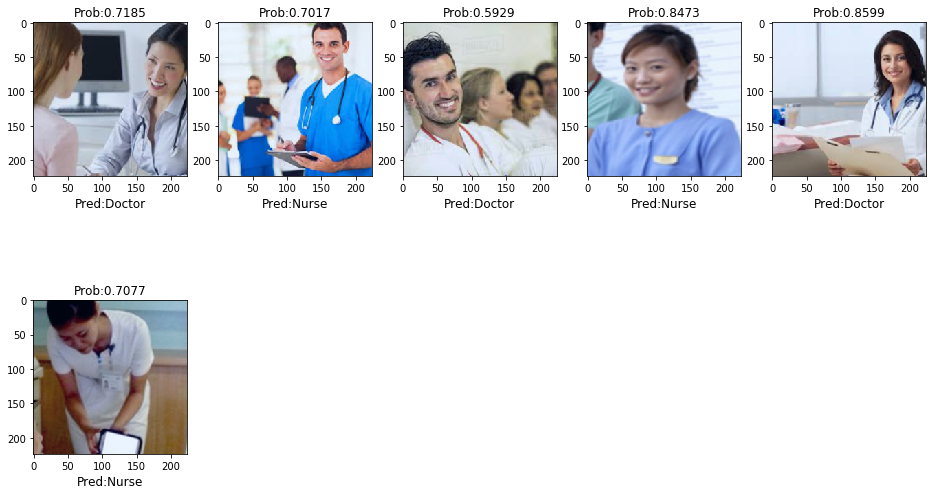

In [16]:
plot_val_with_title(rand_by_correct(True), "Correctly classified (random)")

Incorrectly classified (all)


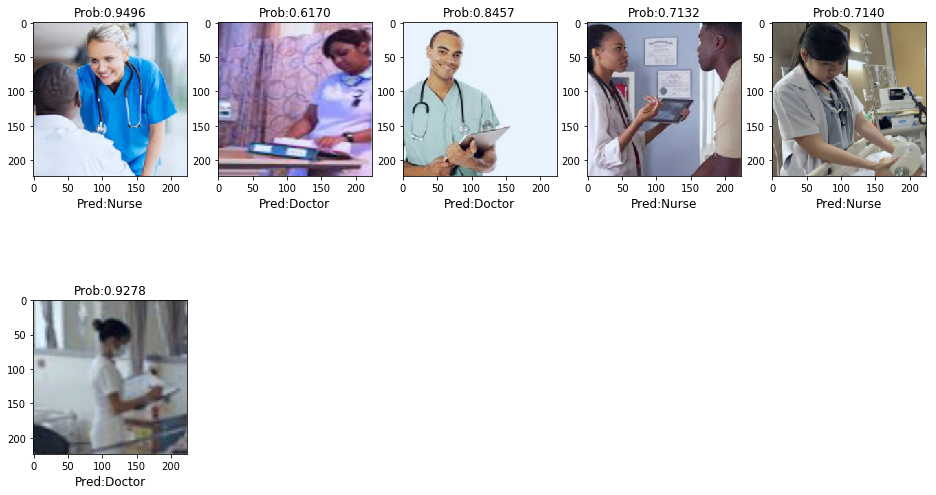

In [17]:
plot_val_with_title(rand_by_correct(False), "Incorrectly classified (all)")

In [18]:
np.count_nonzero((merged_preds == merged_labels)==False)

23

Correct doctor (all)


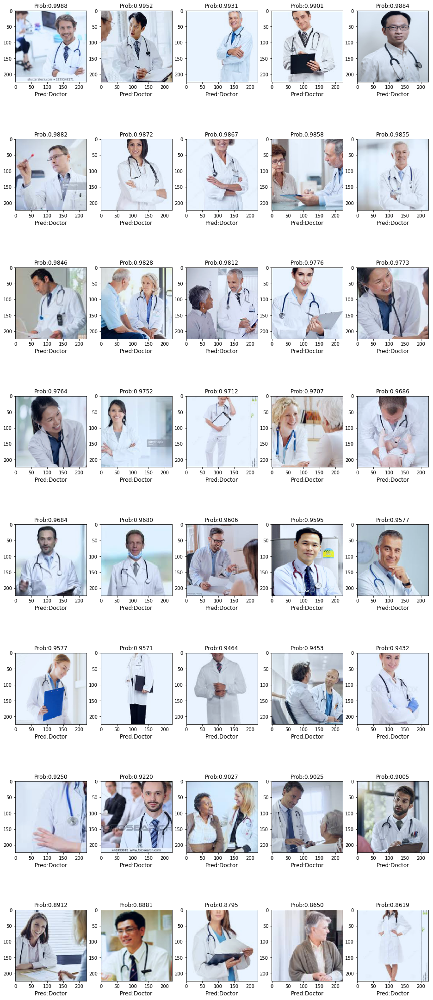

In [19]:
plot_val_with_title(most_by_correct(0, True), 'Correct doctor (all)')

Incorrect doctor (all)


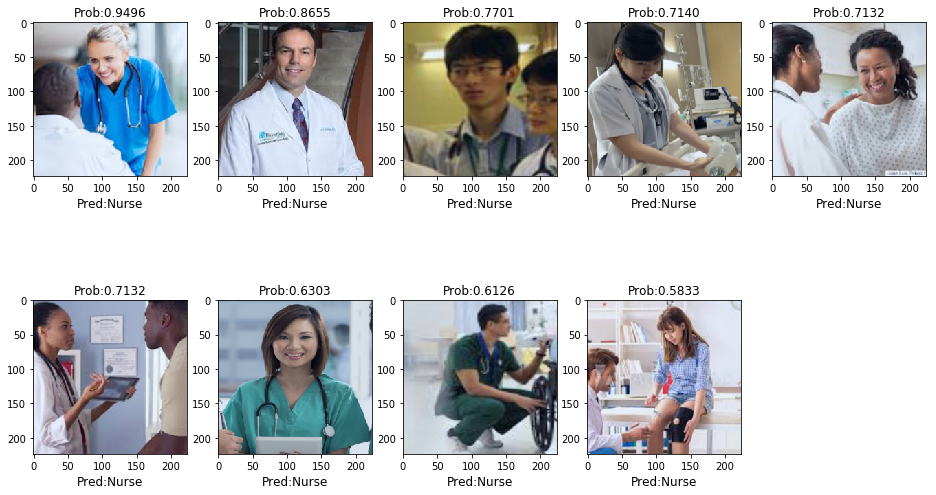

In [20]:
plot_val_with_title(most_by_correct(0, False), 'Incorrect doctor (all)')

Correct nurse (all)


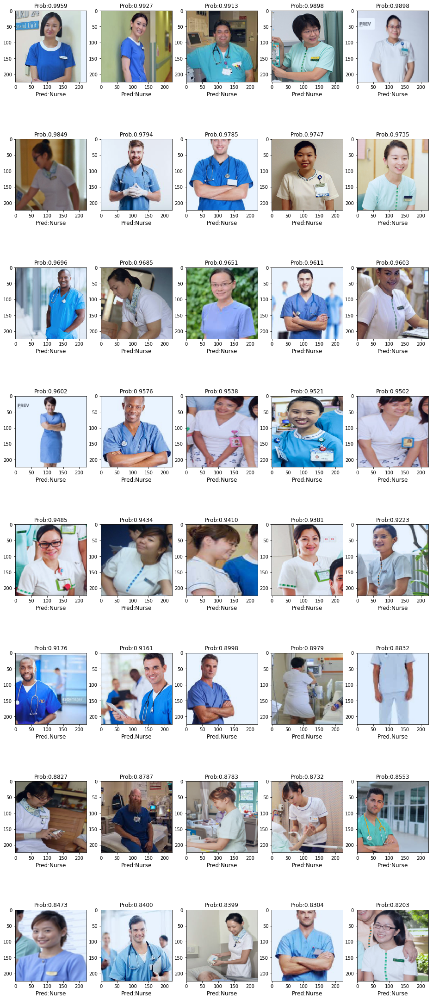

In [21]:
plot_val_with_title(most_by_correct(1, True), 'Correct nurse (all)')

Incorrect nurse (all)


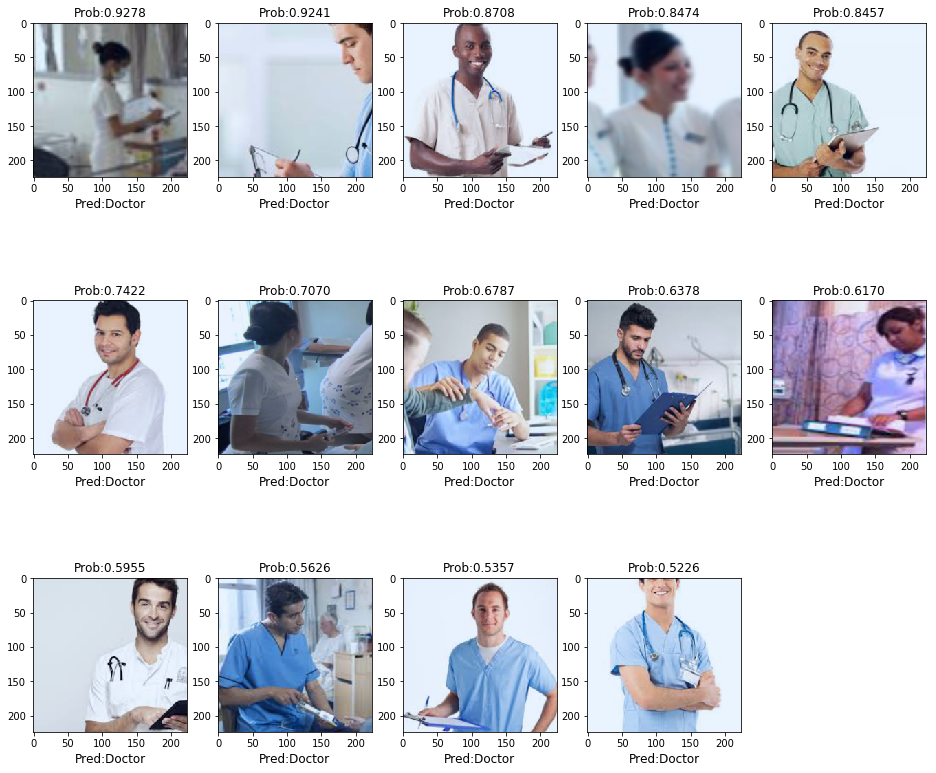

In [22]:
plot_val_with_title(most_by_correct(1, False), 'Incorrect nurse (all)')

Most uncertain predictions


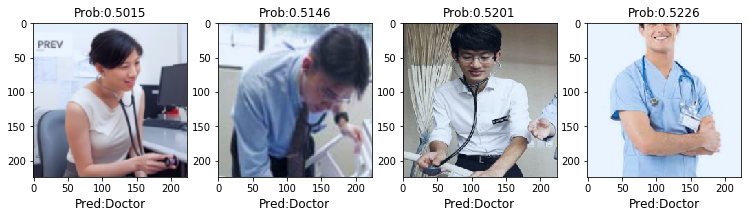

In [23]:
most_uncertain = np.argsort(np.array(merged_probs))[:4]
plot_val_with_title(most_uncertain, "Most uncertain predictions")

In [24]:
doctor_preds = (((merged_preds == merged_labels)==True) & (merged_labels == 0))
nurse_preds = (((merged_preds == merged_labels)==True) & (merged_labels == 1))


doctor_acc = np.count_nonzero(doctor_preds)/np.count_nonzero(merged_labels == 0) * 100 
nurse_acc = np.count_nonzero(nurse_preds)/np.count_nonzero(merged_labels == 1) * 100 

                                                           
print("Doctor Acc:{:.2f}%\nNurse Acc:{:.2f}%".format(doctor_acc, nurse_acc))

Doctor Acc:88.75%
Nurse Acc:82.50%


Text(0.5, 1.0, 'Prediction Performance on Validation Set(by Class)')

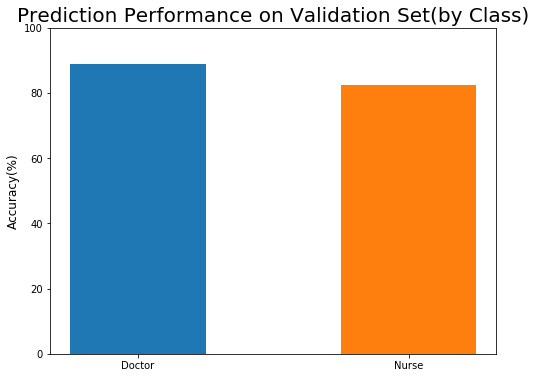

In [25]:
plt.figure(figsize=(8,6))
plt.bar('Doctor', height=doctor_acc, width=0.5)
plt.bar('Nurse', height=nurse_acc, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance on Validation Set(by Class)', fontsize=20)

In [26]:
def load_image(path):
    image = Image.open(path)
    return image

def normalize(image):
    normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
    )
    preprocess = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    normalize
    ])
    image = Variable(preprocess(image).unsqueeze(0))
    return image

def deprocess(image):
    return image * torch.Tensor([0.229, 0.224, 0.225]) + torch.Tensor([0.485, 0.456, 0.406])

normalise = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229,0.224,0.225]
)

preprocess = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    normalise
])

In [27]:
def smooth_grad(input, label, sample=10, percent_noise=10):
    tensor_input = torch.from_numpy(np.array(input)).type(torch.FloatTensor) # input is now of shape (width, height, channel)
    final_grad = torch.zeros((1,3,224,224))
    for i in range(sample):
        temp_input = tensor_input
        # According to the paper, noise level corresponds to std dev/(xmax-xmin). Hence std dev = noise_percentage * (max-min)/100
        noise = torch.from_numpy(np.random.normal(loc=0, scale=(percent_noise/100)*(tensor_input.max()-tensor_input.min()), size=temp_input.shape)).type(torch.FloatTensor)
        temp_input = (temp_input + noise).cpu().numpy()
        temp_input = Image.fromarray(temp_input.astype(np.uint8))
        
        if use_gpu:
            temp_input = Variable(preprocess(temp_input).unsqueeze(0).cuda(), requires_grad=True)
        else:
            temp_input = Variable(preprocess(temp_input).unsqueeze(0), requires_grad=True)
        
        output = model_conv.forward(temp_input)
        output[0][label].backward()
        final_grad += temp_input.grad.data.cpu()
        
    grads = final_grad/sample
    grads = grads.clamp(min=0)
    grads.squeeze_()
    grads.transpose_(0,1)
    grads.transpose_(1,2)
    grads = np.amax(grads.cpu().numpy(), axis=2)
    
    true_image = normalize(input)
    true_image = true_image.squeeze()
    true_image = true_image.transpose(0,1)
    true_image = true_image.transpose(1,2)
    true_image = deprocess(true_image.data)
    
    fig = plt.figure()
    plt.rcParams['figure.figsize'] = (20,20)
    
    a = fig.add_subplot(1,2,1)
    imgplot = plt.imshow(true_image)
    plt.title('Original Image')
    plt.axis('off')
    
    a = fig.add_subplot(1,2,2)
    imgplot = plt.imshow(grads)
    plt.axis('off')
    plt.title('SmoothGrad, Noise:' + str(percent_noise) + '%, ' + 'Samples: ' + str(sample))
    
    return grads

In [28]:
# Load data for test set
data_transforms = {
    'train': transforms.Compose([transforms.Resize(224), transforms.RandomCrop(224), transforms.RandomHorizontalFlip(), transforms.ToTensor(), transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])]),
    'test': transforms.Compose([transforms.Resize(224), transforms.CenterCrop(224), transforms.ToTensor(), transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
}

data_dir = 'final_dataset'

# Create dataset class 
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),data_transforms[x]) for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'test']}
# Obtain dataset sizes for training and validation set
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
# Obtain class names
class_names = image_datasets['train'].classes

use_gpu = torch.cuda.is_available()

In [29]:
print(dataset_sizes, class_names)
print(image_datasets)

{'train': 640, 'test': 200} ['Doctor', 'Nurse']
{'train': Dataset ImageFolder
    Number of datapoints: 640
    Root Location: final_dataset/train
    Transforms (if any): Compose(
                             Resize(size=224, interpolation=PIL.Image.BILINEAR)
                             RandomCrop(size=(224, 224), padding=None)
                             RandomHorizontalFlip(p=0.5)
                             ToTensor()
                             Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                         )
    Target Transforms (if any): None, 'test': Dataset ImageFolder
    Number of datapoints: 200
    Root Location: final_dataset/test
    Transforms (if any): Compose(
                             Resize(size=224, interpolation=PIL.Image.BILINEAR)
                             CenterCrop(size=(224, 224))
                             ToTensor()
                             Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           

In [30]:
label = []
predictions = []
merged_probs = []
images = []

for i, data in enumerate(dataloaders['test']):
    inputs, labels = data
    if use_gpu:
        inputs, labels = Variable(inputs.cuda()), Variable(labels.cuda())
    else:
        inputs, labels = Variable(inputs), Variable(labels)
        
    outputs = model_conv(inputs)
    # Activation and prediction for each image 
    _, preds = torch.max(outputs.data, 1)
    
    # Extract labels into a list
    labels = labels.data.cpu().numpy()
    label.append(labels)
    merged_labels = np.array(list(itertools.chain(*label)))
    
    # Extract predictions into a list
    preds = preds.numpy()
    predictions.append(preds)
    merged_preds = np.array(list(itertools.chain(*predictions)))
                           
    # Extract probabilities into a list
    x = torch.nn.functional.softmax(outputs)
    probs = x.data.cpu().numpy()
    for batch in probs:
        merged_probs.append(max(batch))
    
    # Extract dataset of images in Tensor format
    inputs = inputs.data.cpu().numpy()
    images.append(inputs)
    merged_ds = np.array(list(itertools.chain(*images)))

Correctly classified (random)


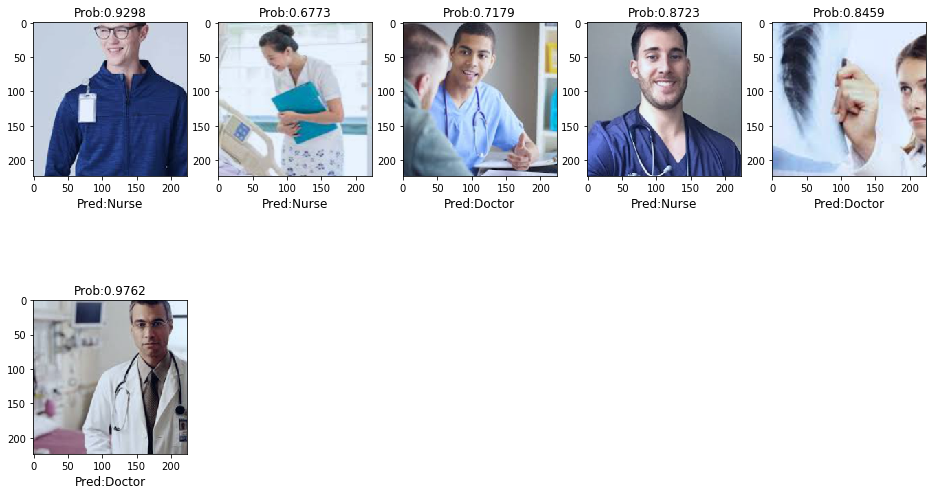

In [31]:
plot_val_with_title(rand_by_correct(True), "Correctly classified (random)")

In [32]:
np.count_nonzero((merged_preds == merged_labels)==False)

43

Correct doctor (all)


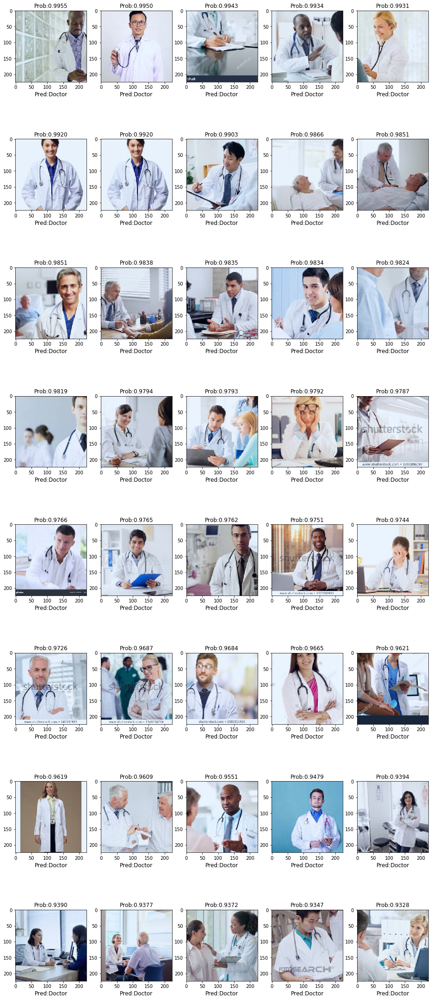

In [33]:
plot_val_with_title(most_by_correct(0, True), 'Correct doctor (all)')

Incorrect doctor (all)


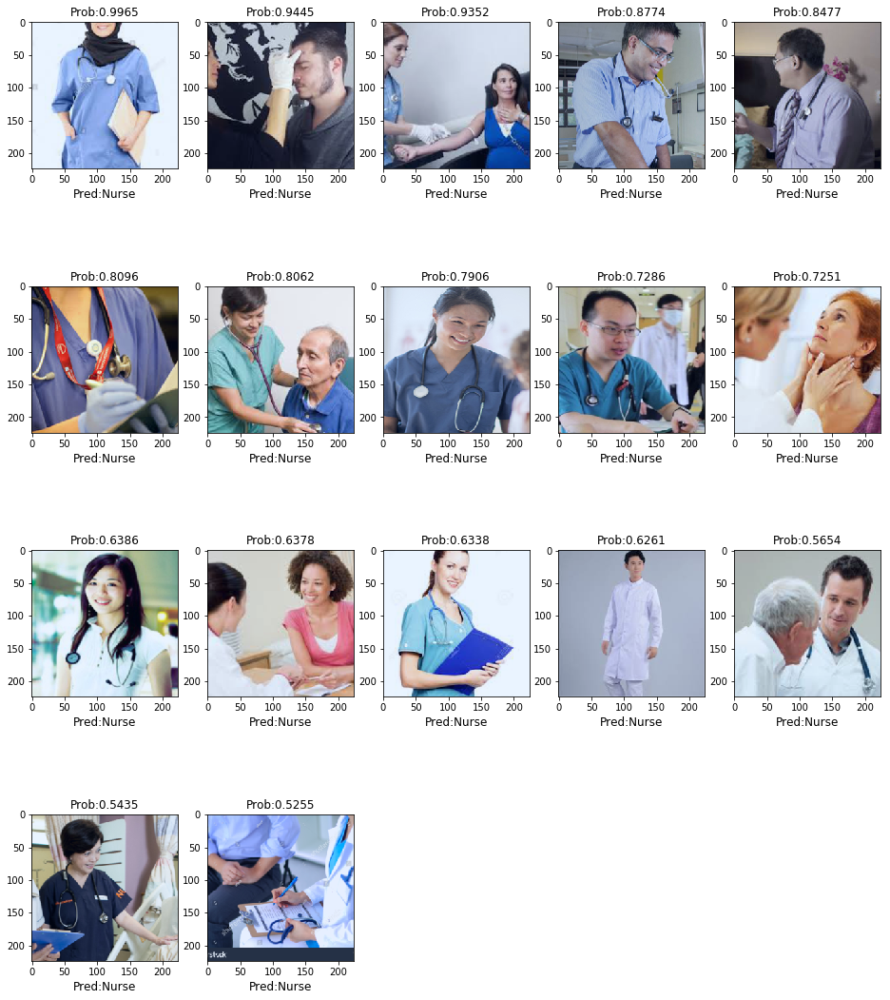

In [34]:
plot_val_with_title(most_by_correct(0, False), 'Incorrect doctor (all)')

Correct nurse (all)


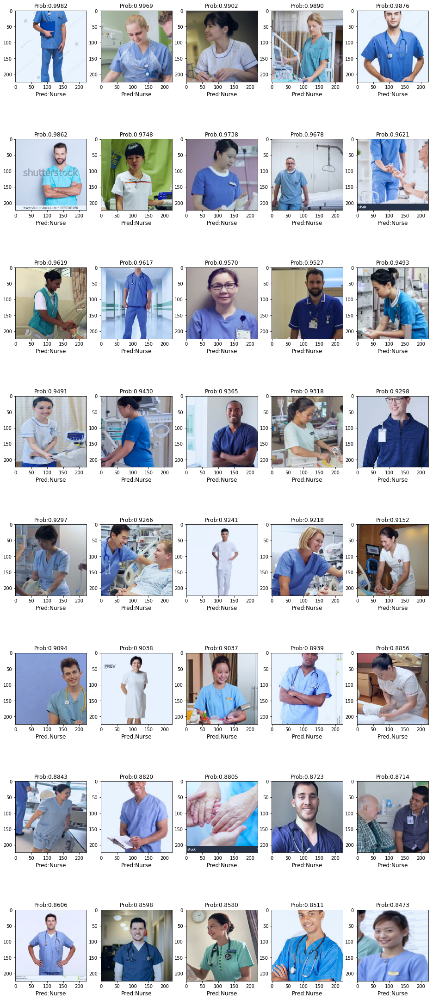

In [35]:
plot_val_with_title(most_by_correct(1, True), 'Correct nurse (all)')

Incorrect nurse (all)


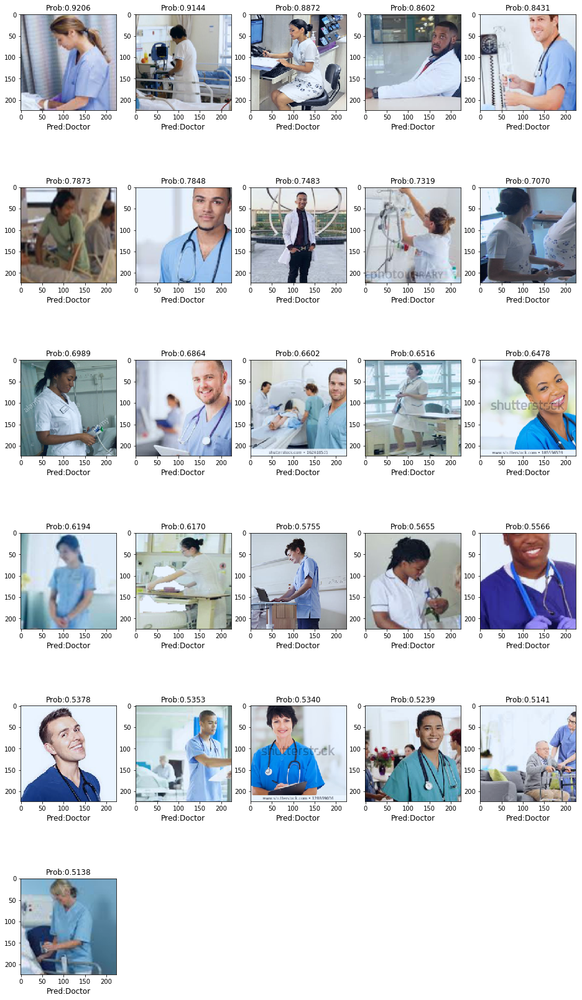

In [36]:
plot_val_with_title(most_by_correct(1, False), 'Incorrect nurse (all)')

Most uncertain predictions


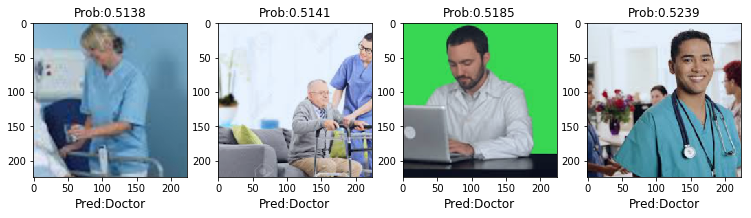

In [37]:
most_uncertain = np.argsort(np.array(merged_probs))[:4]
plot_val_with_title(most_uncertain, "Most uncertain predictions")

In [38]:
doctor_preds = (((merged_preds == merged_labels)==True) & (merged_labels == 0))
nurse_preds = (((merged_preds == merged_labels)==True) & (merged_labels == 1))


doctor_acc = np.count_nonzero(doctor_preds)/np.count_nonzero(merged_labels == 0) * 100 
nurse_acc = np.count_nonzero(nurse_preds)/np.count_nonzero(merged_labels == 1) * 100 

                                                           
print("Doctor Acc:{:.2f}%\nNurse Acc:{:.2f}%".format(doctor_acc, nurse_acc))

Doctor Acc:83.00%
Nurse Acc:74.00%


Text(0.5, 1.0, 'Prediction Performance on Validation Set(by Class)')

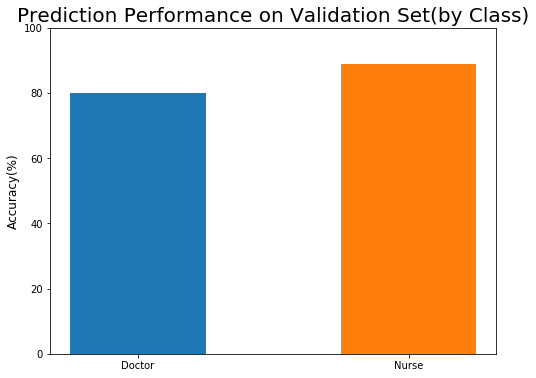

In [39]:
plt.figure(figsize=(8,6))
plt.bar('Doctor', height=80, width=0.5)
plt.bar('Nurse', height=88.8, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance on Validation Set(by Class)', fontsize=20)

Text(0.5, 1.0, 'Prediction Performance on Test Set(by Class)')

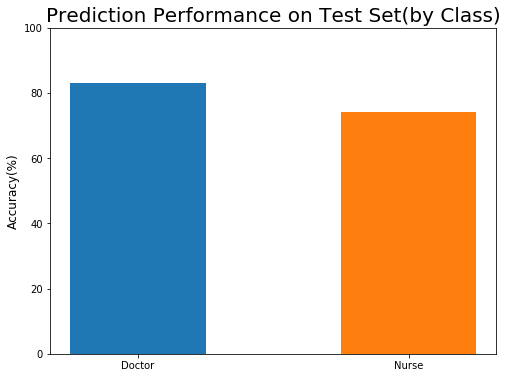

In [40]:
plt.figure(figsize=(8,6))
plt.bar('Doctor', height=doctor_acc, width=0.5)
plt.bar('Nurse', height=nurse_acc, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance on Test Set(by Class)', fontsize=20)

Text(0.5, 1.0, 'Prediction Performance per Gender on Validation Set(Doctor Class)')

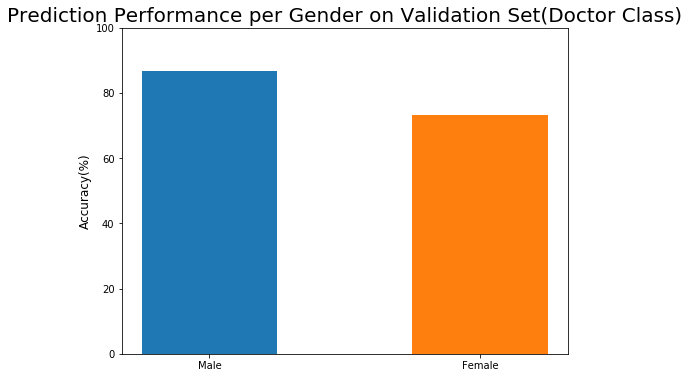

In [41]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=86.6, width=0.5)
plt.bar('Female', height=73.3, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Validation Set(Doctor Class)', fontsize=20)

Text(0.5, 1.0, 'Prediction Performance per Gender on Validation Set(Nurse Class)')

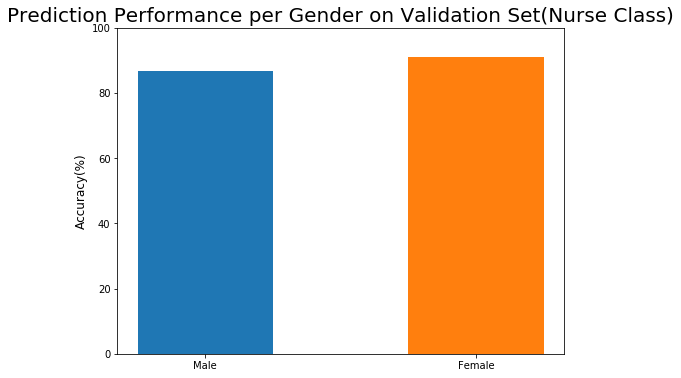

In [42]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=86.6, width=0.5)
plt.bar('Female', height=91.1, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Validation Set(Nurse Class)', fontsize=20)

Text(0.5, 1.0, 'Prediction Performance per Gender on Test Set(Doctor Class)')

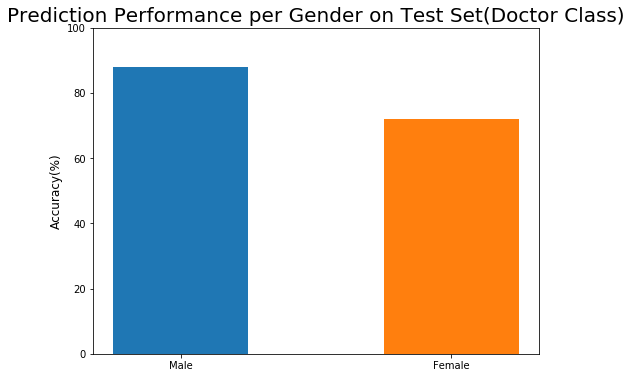

In [43]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=88, width=0.5)
plt.bar('Female', height=72, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Test Set(Doctor Class)', fontsize=20)

Text(0.5, 1.0, 'Prediction Performance per Gender on Test Set(Nurse Class)')

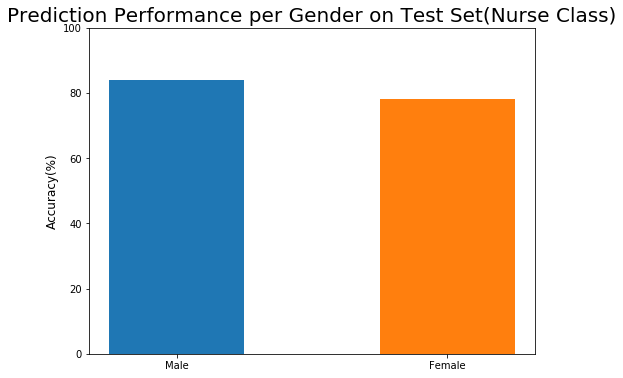

In [44]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=84, width=0.5)
plt.bar('Female', height=78, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Test Set(Nurse Class)', fontsize=20)

Text(0.5, 1.0, 'Prediction Performance per Gender on Validation and Test Set(Doctor Class)')

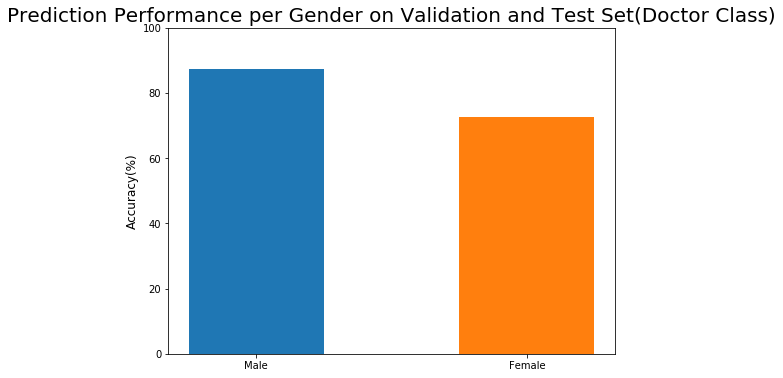

In [45]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=87.4, width=0.5)
plt.bar('Female', height=72.6, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Validation and Test Set(Doctor Class)', fontsize=20)

Text(0.5, 1.0, 'Prediction Performance per Gender on Validation and Test Set(Nurse Class)')

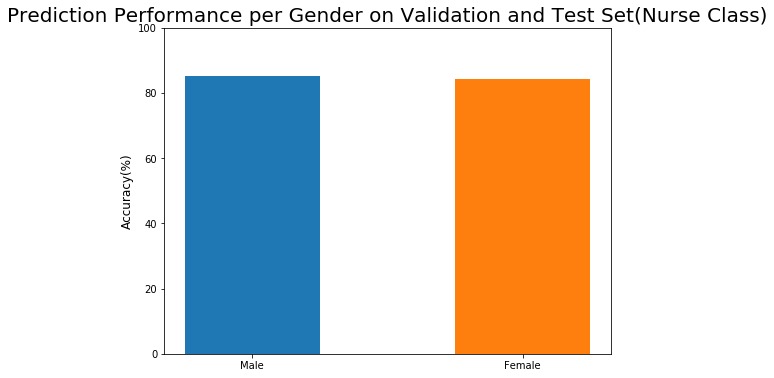

In [46]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=85.3, width=0.5)
plt.bar('Female', height=84.2, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Validation and Test Set(Nurse Class)', fontsize=20)

In [47]:
############## OBJECT DETECTION ###########

In [ ]:
#### Extract Names of images ####
keywords = ['Predicted']
pattern = re.compile('|'.join(keywords))
with open('results.txt') as oldfile, open('images_names.txt', 'w') as outf:
    for line in oldfile:
        if pattern.search(line):
            outf.write(line)

In [ ]:
### Transform names of images into a np array ###
image_name=np.genfromtxt("images_names.txt",dtype=str,comments=':')
image_name

In [ ]:
image_name.shape

In [ ]:
#### Remove : from results txt file ###
with open("results.txt",'r') as f_input, open('results_new.txt', 'w') as outfile:
        data = f_input.read()
        #print(data)
        data = data.replace(":", "")
        outfile.write(data)     

In [ ]:
### Keep only relevant info into the large txt file ###
bad_words = ['Predicted','Start']
with open('results_new.txt') as oldfile, open('coords_large_txtfile.txt', 'w') as newfile:
    for line in oldfile:
        if not any(bad_word in line for bad_word in bad_words):
            newfile.write(line)

In [ ]:
### Split large txt file of object detection into multiple files per image ###
def files():
    n = 0
    while True:
        n += 1
        yield open('%d.txt' % n, 'w')


pat = 'End'
fs = files()
outfile = next(fs) 

with open("coords_large_txtfile.txt") as infile:
    for line in infile:
        if pat not in line:
            outfile.write(line)
        else:
            items = line.split(pat)
            outfile.write(items[0])
            for item in items[1:]:
                outfile = next(fs)
                outfile.write(pat + item)

In [ ]:
#### Remove % and End from small txt files  ###
file_list = sorted(glob.glob(os.path.join(os.getcwd(), "texts", "*.txt")),key=os.path.getmtime)
i=0
for file_path in file_list:
    print(file_path)
    i+=1
    with open(file_path,'r') as f_input, open('%i.txt' %i, 'w') as outfile:
        data = f_input.read()
        #print(data)
        data = data.replace("%", "")
        data = data.replace("End","")
        outfile.write(data)
        outfile.close

In [ ]:
### Load txt files to a list ######
file_list = sorted(glob.glob(os.path.join(os.getcwd(), "texts", "*.txt")),key=os.path.getmtime)

corpus = []

for file_path in file_list:
    with open(file_path) as f_input:
        a=np.genfromtxt(f_input,dtype=str,usecols = (0, 1, 3,5,7,9),comments=')')
        corpus.append(a)

print (corpus) 

In [ ]:
len(corpus)

In [ ]:
### Append image names to the list ###
for i in range(image_name.shape[0]):
    corpus.insert(i*2,image_name[i])
corpus

In [ ]:
len(corpus)

In [ ]:
corpus[1][1][3]

In [ ]:
import pickle
 
with open('ODdoc.pkl', 'wb') as f:
    pickle.dump(corpus, f)

In [48]:
import pickle
with open('ODdoc.pkl', 'rb') as f:
    newcorpus = pickle.load(f)

In [49]:
len(newcorpus)

74

In [50]:
corpus=newcorpus

In [51]:
corpus

['exp/in_images/small_Ddr-farhad-homepage.jpg',
 array([['bench', '14', '0', '180', '28', '42'],
        ['person', '100', '15', '11', '169', '204'],
        ['chair', '18', '168', '179', '12', '24'],
        ['chair', '50', '168', '202', '39', '22']], dtype='<U6'),
 'exp/in_images/small_106aaa.jpg',
 array([['person', '100', '15', '15', '115', '204'],
        ['book', '33', '84', '107', '56', '43'],
        ['person', '99', '106', '9', '121', '209']], dtype='<U6'),
 'exp/in_images/small_78aaa.jpg',
 array([['person', '97', '19', '16', '114', '202'],
        ['person', '100', '82', '11', '133', '207'],
        ['chair', '8', '144', '214', '84', '11']], dtype='<U6'),
 'exp/in_images/small_114aaa.jpg',
 array(['person', '100', '31', '14', '167', '197'], dtype='<U6'),
 'exp/in_images/small_141aaa.jpg',
 array([['person', '11', '-2', '6', '84', '212'],
        ['person', '100', '10', '2', '206', '221'],
        ['cell_phone', '13', '122', '90', '3', '7'],
        ['cell_phone', '10', '122'

In [ ]:
################ Attention Mechanism ################ 


In [ ]:
### Insert Images-names into a list ###
path = os.path.abspath("exp/in_images")
path

In [ ]:
imaste=np.array([])
imaste

In [ ]:
for image_path in os.listdir(path):
    if (image_path == path + '.DS_Store'):
        continue
    input_path = os.path.join(path, image_path)
    if (image_path != ".DS_Store"):
        #print(os.path.relpath(input_path))
        imaste=np.append(imaste, os.path.relpath(input_path))
imaste

In [ ]:
imaste.shape

In [ ]:
corpus_AM=[]

In [ ]:
path = os.path.abspath("exp/in_images")
path

In [ ]:
### Smooth-Grad and Bounding Boxes ###
for image_path in os.listdir(path):
    print(image_path)
    if (image_path == path + '.DS_Store'):
        continue
    input_path = os.path.join(path, image_path)
    doctor1_cor = load_image(input_path)
    doctor1_incor_sg = smooth_grad(doctor1_cor,0,300,10) #### 0 for doctor, 1 for nurse
    #scipy.misc.toimage(doctor1_incor_sg).save('man_doctor_grey.jpg')### comment out
    blurred = cv2.GaussianBlur(doctor1_incor_sg, (11, 11), 0)
    #scipy.misc.toimage(blurred).save('man_doctor_grey_blurred.jpg')### comment out
    thresh = cv2.threshold(blurred, 5.30815004e-04, 255, cv2.THRESH_BINARY)[1]
    #scipy.misc.toimage(thresh).save('man_doctor_grey_thresh.jpg')### comment out
    thresh = cv2.erode(thresh, None, iterations=2)
    thresh = cv2.dilate(thresh, None, iterations=4)
    #scipy.misc.toimage(thresh).save('man_doctor_grey_er_dil.jpg')### comment out
    # perform a connected component analysis on the thresholded
    # image, then initialize a mask to store only the "large"
    # components
    labels = measure.label(thresh, neighbors=8, background=0)
    mask = np.zeros(thresh.shape, dtype="uint8")
    
 
    # loop over the unique components
    for label in np.unique(labels):
        # if this is the background label, ignore it
        if label == 0:
            continue
     #otherwise, construct the label mask and count the
     #number of pixels 
        labelMask = np.zeros(thresh.shape, dtype="uint8")
        labelMask[labels == label] = 255
        numPixels = cv2.countNonZero(labelMask)
     #if the number of pixels in the component is sufficiently
     #large, then add it to our mask of "large blobs"
        if numPixels > 200:
            mask = cv2.add(mask, labelMask)
    # find the contours in the mask, then sort them from left to
    # right
    #scipy.misc.toimage(mask).save('man_doctor_grey_mask.jpg')### comment out
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = contours.sort_contours(cnts)[0]
 
    big_array=[]


    # loop over the contours
    for (i, c) in enumerate(cnts):
    #draw the bright spot on the image
        (x, y, w, h) = cv2.boundingRect(c)
        #print(x, y, w, h)
        egw=cv2.rectangle(doctor1_incor_sg,(x,y),(x+w,y+h),(0, 255, 255),2)
        #toimage(egw).show()
        big_array.append([x,y,w,h])
    corpus_AM.append(big_array)
#scipy.misc.toimage(egw).save('man_doctor_gray_bound.jpg')### comment out
#print(len(cnts))

In [ ]:
### Comment out##
#image = Image.open("exp/in_images/Unknown.png")
#image.show()

In [ ]:
#image_resized = misc.imresize(image, (224, 224))

In [ ]:
#toimage(final_image).show()=cv2.rectangle(image_resized,(x,y),(x+w,y+h),(255,0,0),2)

In [ ]:
#toimage(final_image).show()

In [ ]:
#scipy.misc.toimage(final_image).save('final_boundary.png')

In [ ]:
corpus_AM

In [ ]:
import pickle
 
with open('parrot.pkl', 'wb') as f:
    pickle.dump(corpus_AM, f)


In [52]:
import pickle
with open('parrot.pkl', 'rb') as f:
    mynewlist = pickle.load(f)

In [53]:
mynewlist

['exp/in_images/small_Ddr-farhad-homepage.jpg',
 [[7, 92, 19, 24], [21, 0, 203, 224], [149, 195, 26, 22], [149, 181, 22, 12]],
 'exp/in_images/small_106aaa.jpg',
 [[33, 0, 115, 195], [61, 214, 24, 10], [142, 35, 14, 18]],
 'exp/in_images/small_DST_20171120_VNDOC.jpg',
 [[23, 148, 16, 21], [69, 41, 75, 69], [158, 209, 20, 15]],
 'exp/in_images/small_78aaa.jpg',
 [[87, 21, 85, 100]],
 'exp/in_images/small_114aaa.jpg',
 [[37, 93, 40, 46], [65, 183, 26, 10], [128, 154, 25, 26], [156, 96, 13, 29]],
 'exp/in_images/small_141aaa.jpg',
 [[24, 29, 17, 25],
  [93, 93, 53, 65],
  [120, 61, 16, 17],
  [154, 51, 21, 27],
  [164, 93, 27, 33],
  [167, 147, 14, 23]],
 'exp/in_images/small_inpatient_stay_copy.jpg',
 [[0, 133, 50, 55],
  [39, 160, 20, 32],
  [42, 14, 120, 128],
  [67, 169, 24, 32],
  [82, 134, 18, 18],
  [88, 191, 18, 17],
  [98, 157, 16, 17],
  [123, 145, 25, 26],
  [135, 103, 63, 41],
  [214, 124, 10, 29]],
 'exp/in_images/small_87aaa.jpg',
 [[42, 120, 23, 27],
  [42, 0, 37, 20],
  [6

In [ ]:
toimage(egw).show()

In [ ]:
### Insert names of images into AM List ###
for i in range(imaste.shape[0]):
    corpus_AM.insert(i*2,imaste[i])
corpus_AM

In [54]:
len(mynewlist)

72

In [ ]:
corpus_AM[1]

In [ ]:
############### Correlation Attention Mechanism and Object detection ########################

In [55]:
corpus_objects_matter=[]

In [56]:
def bb_intersection_over_union(boxA, boxB):
# determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
 
    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
 
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
 
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)
 
    # return the intersection over union value
    return iou

In [57]:
### Correlation OD-AM ###
#for i in range(image_name.shape[0]):
for i in range(37):
    #print("i=",i)
    #for j in range(imaste.shape[0]):
     for j in range(36):
        #print("j=",j)
        if (corpus[i*2]==mynewlist[j*2]):
            #print(corpus[i*2])
            if (corpus[2*i+1].ndim>1):
                for k in range (len(corpus[2*i+1])):
                    #print("k=",k)
                    for l in range (len(mynewlist[2*j+1])):
                        #print("l=",l)
                        boxA=[int(corpus[2*i+1][k][2]),int(corpus[2*i+1][k][3]),int(corpus[2*i+1][k][2])+int(corpus[2*i+1][k][4]),int(corpus[2*i+1][k][3])+int(corpus[2*i+1][k][5])]
                        boxB=[mynewlist[2*j+1][l][0],mynewlist[2*j+1][l][1],mynewlist[2*j+1][l][0]+mynewlist[2*j+1][l][2],mynewlist[2*j+1][l][1]+mynewlist[2*j+1][l][3]]
                        iou=bb_intersection_over_union(boxA, boxB)
                        if (iou>=0.3):
                            #print("iou =","%.2f" % iou)
                            #print(corpus[2*i],corpus[2*i+1][k][0],int(corpus[2*i+1][k][2]),int(corpus[2*i+1][k][3]),int(corpus[2*i+1][k][4]),int(corpus[2*i+1][k][5]))
                            corpus_objects_matter.append([corpus[2*i],corpus[2*i+1][k][0],int(corpus[2*i+1][k][2]),int(corpus[2*i+1][k][3]),int(corpus[2*i+1][k][2])+int(corpus[2*i+1][k][4]),int(corpus[2*i+1][k][3])+int(corpus[2*i+1][k][5])])
            elif (corpus[2*i+1].ndim==1):
                if(corpus[2*i+1].shape[0]>0):
                    for k in range (corpus[2*i+1].ndim):
                        #print("k=",k)
                        for l in range (len(mynewlist[2*j+1])):
                            #print("l=",l)
                            boxA=[int(corpus[2*i+1][2]),int(corpus[2*i+1][3]),int(corpus[2*i+1][2])+int(corpus[2*i+1][4]),int(corpus[2*i+1][3])+int(corpus[2*i+1][5])]
                            boxB=[mynewlist[2*j+1][l][0],mynewlist[2*j+1][l][1],mynewlist[2*j+1][l][0]+mynewlist[2*j+1][l][2],mynewlist[2*j+1][l][1]+mynewlist[2*j+1][l][3]]
                            iou=bb_intersection_over_union(boxA, boxB)
                            if (iou>=0.3):
                                #print("iou =","%.2f" % iou)
                                #print(corpus[2*i],corpus[2*i+1][0],int(corpus[2*i+1][2]),int(corpus[2*i+1][3]),int(corpus[2*i+1][4]),int(corpus[2*i+1][5]))
                                corpus_objects_matter.append([corpus[2*i],corpus[2*i+1][0],int(corpus[2*i+1][2]),int(corpus[2*i+1][3]),int(corpus[2*i+1][2])+int(corpus[2*i+1][4]),int(corpus[2*i+1][3])+int(corpus[2*i+1][5])])
            

In [58]:
corpus_objects_matter

[['exp/in_images/small_Ddr-farhad-homepage.jpg', 'person', 15, 11, 184, 215],
 ['exp/in_images/small_106aaa.jpg', 'person', 15, 15, 130, 219],
 ['exp/in_images/small_78aaa.jpg', 'person', 82, 11, 215, 218],
 ['exp/in_images/small_87aaa.jpg', 'laptop', 130, 166, 190, 204],
 ['exp/in_images/small_87aaa.jpg', 'cell_phone', 140, 167, 184, 185],
 ['exp/in_images/small_99aaa.jpg', 'person', 116, 13, 199, 215],
 ['exp/in_images/small_Dmeh_news_image_3_copy.jpg',
  'person',
  12,
  -1,
  207,
  224],
 ['exp/in_images/small_Dhospital_mockup.jpg', 'person', 4, 9, 212, 215],
 ['exp/in_images/small_inpatient_stay_copy.jpg', 'person', 9, 8, 216, 221],
 ['exp/in_images/small_134aaa.jpg', 'person', -5, 19, 164, 226],
 ['exp/in_images/small_65.jpg', 'person', 75, 18, 156, 215],
 ['exp/in_images/small_71.jpg', 'person', 20, 29, 205, 224],
 ['exp/in_images/small_71.jpg', 'person', 164, 63, 195, 152],
 ['exp/in_images/small_71.jpg', 'person', 197, 111, 224, 225],
 ['exp/in_images/small_117.jpg', 'person

In [59]:
len(corpus_objects_matter)

28

In [ ]:
corpus_objects_matter[24][1]

In [ ]:
##### Plot object matter #####

In [60]:
plot_objects=[]

In [61]:
for i in range(len(corpus_objects_matter)):
    plot_objects.append(corpus_objects_matter[i][1])
    

In [62]:
plot_objects

['person',
 'person',
 'person',
 'laptop',
 'cell_phone',
 'person',
 'person',
 'person',
 'person',
 'person',
 'person',
 'person',
 'person',
 'person',
 'person',
 'person',
 'person',
 'tennis_racket',
 'person',
 'person',
 'person',
 'backpack',
 'keyboard',
 'person',
 'laptop',
 'laptop',
 'person',
 'person']

In [63]:
del plot_objects[17]

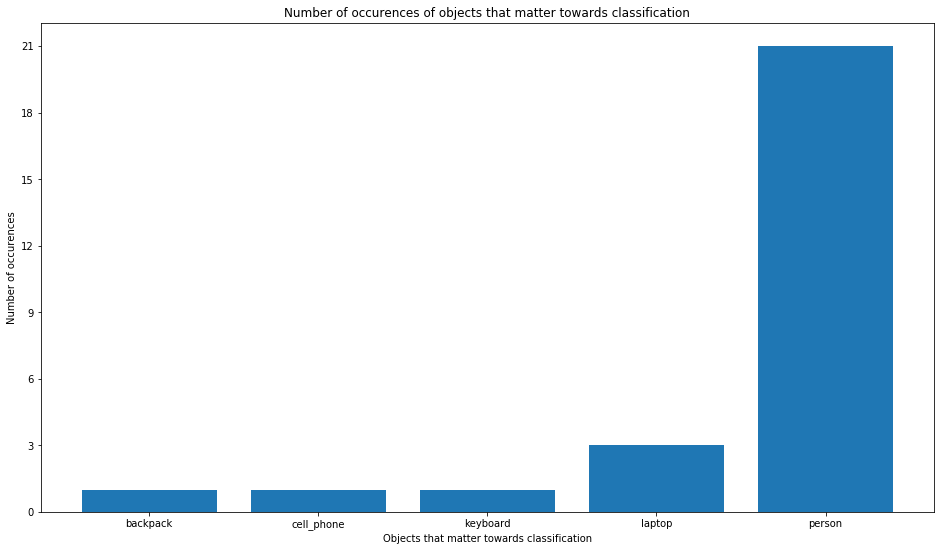

In [66]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
plt.rcParams["figure.figsize"] = [16,9]

ax = plt.figure().gca()
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
y = np.array(plot_objects)


labels, counts = np.unique(plot_objects, return_counts=True)
plt.bar(labels, counts, align='center')
plt.gca().set_xticks(labels)



plt.title('Number of occurences of objects that matter towards classification')
plt.xlabel('Objects that matter towards classification')
plt.ylabel('Number of occurences')


plt.show()

In [ ]:
############## BLURRING ###############

In [ ]:
path = os.path.abspath("exp/in_images")
path

In [ ]:
for image_path in os.listdir(path):
    if (image_path == path + '.DS_Store'):
        continue 
    input_path = os.path.join(path, image_path)
    if (image_path != ".DS_Store"):
        for i in range(len(corpus_objects_matter)):
            if(os.path.relpath(input_path)==corpus_objects_matter[i][0]):
                image=Image.open(corpus_objects_matter[i][0])
                cropped_image=image.crop((corpus_objects_matter[i][2],corpus_objects_matter[i][3],corpus_objects_matter[i][4],corpus_objects_matter[i][5]))
                blurred_image=cropped_image.filter(ImageFilter.GaussianBlur(radius=20))
                image.paste(blurred_image,(corpus_objects_matter[i][2],corpus_objects_matter[i][3],corpus_objects_matter[i][4],corpus_objects_matter[i][5]))
                image.save('exp/blurred/Image'+str(i)+'.jpg')

In [ ]:
############### CLASSIFICATION AFTER BLURRING ###############

In [ ]:
# Load data for test after blurring
data_transforms = {
    'train': transforms.Compose([transforms.Resize(224), transforms.RandomCrop(224), transforms.RandomHorizontalFlip(), transforms.ToTensor(), transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])]),
    'test': transforms.Compose([transforms.Resize(224), transforms.CenterCrop(224), transforms.ToTensor(), transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
}

data_dir = 'data_after_blurring'

# Create dataset class 
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),data_transforms[x]) for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'test']}
# Obtain dataset sizes for training and validation set
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
# Obtain class names
class_names = image_datasets['train'].classes

use_gpu = torch.cuda.is_available()

In [ ]:
print(dataset_sizes, class_names)
print(image_datasets)

In [ ]:
label = []
predictions = []
merged_probs = []
images = []

for i, data in enumerate(dataloaders['test']):
    inputs, labels = data
    if use_gpu:
        inputs, labels = Variable(inputs.cuda()), Variable(labels.cuda())
    else:
        inputs, labels = Variable(inputs), Variable(labels)
        
    outputs = model_conv(inputs)
    # Activation and prediction for each image 
    _, preds = torch.max(outputs.data, 1)
    
    # Extract labels into a list
    labels = labels.data.cpu().numpy()
    label.append(labels)
    merged_labels = np.array(list(itertools.chain(*label)))
    
    # Extract predictions into a list
    preds = preds.numpy()
    predictions.append(preds)
    merged_preds = np.array(list(itertools.chain(*predictions)))
                           
    # Extract probabilities into a list
    x = torch.nn.functional.softmax(outputs)
    probs = x.data.cpu().numpy()
    for batch in probs:
        merged_probs.append(max(batch))
    
    # Extract dataset of images in Tensor format
    inputs = inputs.data.cpu().numpy()
    images.append(inputs)
    merged_ds = np.array(list(itertools.chain(*images)))

In [ ]:
plot_val_with_title(rand_by_correct(True), "Correctly classified (random)")

In [ ]:
np.count_nonzero((merged_preds == merged_labels)==False)

In [ ]:
plot_val_with_title(most_by_correct(0, True), 'Correct doctor (all)')

In [ ]:
plot_val_with_title(most_by_correct(0, False), 'Incorrect doctor (all)')

In [ ]:
doctor_preds = (((merged_preds == merged_labels)==True) & (merged_labels == 0))
#nurse_preds = (((merged_preds == merged_labels)==True) & (merged_labels == 1))


doctor_acc = np.count_nonzero(doctor_preds)/np.count_nonzero(merged_labels == 0) * 100 
#nurse_acc = np.count_nonzero(nurse_preds)/np.count_nonzero(merged_labels == 1) * 100 

print("Doctor Acc:{:.2f}%".format(doctor_acc))                                                       
#print("Doctor Acc:{:.2f}%\nNurse Acc:{:.2f}%".format(doctor_acc, nurse_acc))

In [ ]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=92.7, width=0.5)
plt.bar('Female', height=84.2, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Validation and Test Set(Doctor Class)', fontsize=20)

In [ ]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=92.8, width=0.5)
plt.bar('Female', height=93.2, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Validation and Test Set(Nurse Class)', fontsize=20)

In [ ]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=92, width=0.5)
plt.bar('Female', height=84, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Test Set(Doctor Class)', fontsize=20)

In [ ]:
############### Same procedure for Nurses ###############

In [ ]:
############## OBJECT DETECTION ###########

In [ ]:
#### Extract Names of images ####
keywords = ['Predicted']
pattern = re.compile('|'.join(keywords))
with open('results.txt') as oldfile, open('images_names.txt', 'w') as outf:
    for line in oldfile:
        if pattern.search(line):
            outf.write(line)

In [ ]:
### Transform names of images into a np array ###
nurse_image_name=np.genfromtxt("images_names.txt",dtype=str,comments=':')
nurse_image_name

In [ ]:
nurse_image_name.shape

In [ ]:
#### Remove : from results txt file ###
with open("results.txt",'r') as f_input, open('results_new.txt', 'w') as outfile:
        data = f_input.read()
        #print(data)
        data = data.replace(":", "")
        outfile.write(data)  

In [ ]:
### Keep only relevant info into the large txt file ###
bad_words = ['Predicted','Start']
with open('results_new.txt') as oldfile, open('coords_large_txtfile.txt', 'w') as newfile:
    for line in oldfile:
        if not any(bad_word in line for bad_word in bad_words):
            newfile.write(line)

In [ ]:
### Split large txt file of object detection into multiple files per image ###
def files():
    n = 0
    while True:
        n += 1
        yield open('%d.txt' % n, 'w')


pat = 'End'
fs = files()
outfile = next(fs) 

with open("coords_large_txtfile.txt") as infile:
    for line in infile:
        if pat not in line:
            outfile.write(line)
        else:
            items = line.split(pat)
            outfile.write(items[0])
            for item in items[1:]:
                outfile = next(fs)
                outfile.write(pat + item)

In [ ]:
#### Remove % and End from small txt files  ###
file_list = sorted(glob.glob(os.path.join(os.getcwd(), "texts", "*.txt")),key=os.path.getmtime)
i=0
for file_path in file_list:
    print(file_path)
    i+=1
    with open(file_path,'r') as f_input, open('%i.txt' %i, 'w') as outfile:
        data = f_input.read()
        #print(data)
        data = data.replace("%", "")
        data = data.replace("End","")
        outfile.write(data)
        outfile.close

In [ ]:
### Load txt files to a list ######
file_list = sorted(glob.glob(os.path.join(os.getcwd(), "texts", "*.txt")),key=os.path.getmtime)

nurse_corpus = []

for file_path in file_list:
    with open(file_path) as f_input:
        a=np.genfromtxt(f_input,dtype=str,usecols = (0, 1, 3,5,7,9),comments=')')
        nurse_corpus.append(a)

print (nurse_corpus) 

In [ ]:
len(nurse_corpus)

In [ ]:
### Append image names to the list ###
for i in range(nurse_image_name.shape[0]):
    nurse_corpus.insert(i*2,nurse_image_name[i])
nurse_corpus

In [ ]:
nurse_corpus[1][1][0]

In [ ]:
len(nurse_corpus)

In [ ]:
import pickle
 
with open('ODnurse.pkl', 'wb') as f:
    pickle.dump(nurse_corpus, f)

In [67]:
import pickle
with open('ODnurse.pkl', 'rb') as f:
    nursenewcorpus = pickle.load(f)

In [68]:
nursenewcorpus

['exp/in_images/small_42b.jpg',
 array([['person', '100', '10', '12', '204', '198'],
        ['tie', '16', '64', '102', '132', '64']], dtype='<U6'),
 'exp/in_images/small_N097.jpg',
 array(['person', '100', '16', '14', '186', '204'], dtype='<U6'),
 'exp/in_images/small_81b.jpg',
 array([['refrigerator', '11', '28', '3', '173', '215'],
        ['person', '100', '77', '2', '141', '218']], dtype='<U12'),
 'exp/in_images/small_NV005_2.PNG',
 array([['person', '33', '0', '4', '51', '239'],
        ['person', '100', '27', '9', '170', '209'],
        ['tie', '8', '105', '129', '25', '99']], dtype='<U6'),
 'exp/in_images/small_22b.jpg',
 array(['person', '100', '2', '3', '185', '217'], dtype='<U6'),
 'exp/in_images/small_7b.jpg',
 array(['person', '90', '104', '2', '119', '225'], dtype='<U6'),
 'exp/in_images/small_64b.jpg',
 array([['diningtable', '27', '9', '195', '205', '30'],
        ['person', '99', '21', '18', '181', '182'],
        ['tie', '30', '26', '51', '175', '152']], dtype='<U11')

In [77]:
nurse_corpus=nursenewcorpus

In [69]:
len(nursenewcorpus)

58

In [78]:
len(nurse_corpus)

58

In [ ]:
################ Attention Mechanism ################ 

In [ ]:
### Insert Images-names into a list ###
path = os.path.abspath("exp/in_images")
path

In [ ]:
nurse_imaste=np.array([])
nurse_imaste

In [ ]:
for image_path in os.listdir(path):
    if (image_path == path + '.DS_Store'):
        continue
    input_path = os.path.join(path, image_path)
    if (image_path != ".DS_Store"):
        #print(os.path.relpath(input_path))
        nurse_imaste=np.append(nurse_imaste, os.path.relpath(input_path))
nurse_imaste

In [ ]:
nurse_imaste.shape

In [ ]:
nurse_corpus_AM=[]

In [ ]:
path = os.path.abspath("exp/in_images")
path

In [ ]:
### Smooth-Grad and Bounding Boxes ###
for image_path in os.listdir(path):
    print(image_path)
    if (image_path == path + '.DS_Store'):
        continue
    input_path = os.path.join(path, image_path)
    doctor1_cor = load_image(input_path)
    doctor1_incor_sg = smooth_grad(doctor1_cor,1,300,10) #### 0 for doctor, 1 for nurse
    #scipy.misc.toimage(doctor1_incor_sg).save('man_doctor_grey.jpg')### comment out
    blurred = cv2.GaussianBlur(doctor1_incor_sg, (11, 11), 0)
    #scipy.misc.toimage(blurred).save('man_doctor_grey_blurred.jpg')### comment out
    thresh = cv2.threshold(blurred, 5.30815004e-04, 255, cv2.THRESH_BINARY)[1]
    #scipy.misc.toimage(thresh).save('man_doctor_grey_thresh.jpg')### comment out
    thresh = cv2.erode(thresh, None, iterations=2)
    thresh = cv2.dilate(thresh, None, iterations=4)
    #scipy.misc.toimage(thresh).save('man_doctor_grey_er_dil.jpg')### comment out
    # perform a connected component analysis on the thresholded
    # image, then initialize a mask to store only the "large"
    # components
    labels = measure.label(thresh, neighbors=8, background=0)
    mask = np.zeros(thresh.shape, dtype="uint8")
    
 
    # loop over the unique components
    for label in np.unique(labels):
        # if this is the background label, ignore it
        if label == 0:
            continue
     #otherwise, construct the label mask and count the
     #number of pixels 
        labelMask = np.zeros(thresh.shape, dtype="uint8")
        labelMask[labels == label] = 255
        numPixels = cv2.countNonZero(labelMask)
     #if the number of pixels in the component is sufficiently
     #large, then add it to our mask of "large blobs"
        if numPixels > 200:
            mask = cv2.add(mask, labelMask)
    # find the contours in the mask, then sort them from left to
    # right
    #scipy.misc.toimage(mask).save('man_doctor_grey_mask.jpg')### comment out
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = contours.sort_contours(cnts)[0]
 
    big_array=[]


    # loop over the contours
    for (i, c) in enumerate(cnts):
    #draw the bright spot on the image
        (x, y, w, h) = cv2.boundingRect(c)
        #print(x, y, w, h)
        egw=cv2.rectangle(doctor1_incor_sg,(x,y),(x+w,y+h),(0, 255, 255),2)
        #toimage(egw).show()
        big_array.append([x,y,w,h])
    nurse_corpus_AM.append(big_array)
#scipy.misc.toimage(egw).save('man_doctor_gray_bound.jpg')### comment out
#print(len(cnts))

In [ ]:
### Insert names of images into AM List ###
for i in range(nurse_imaste.shape[0]):
    nurse_corpus_AM.insert(i*2,nurse_imaste[i])
nurse_corpus_AM

In [ ]:
len(nurse_corpus_AM)

In [ ]:
nurse_corpus_AM[9]

In [ ]:
import pickle
 
with open('nurseAM.pkl', 'wb') as f:
    pickle.dump(nurse_corpus_AM, f)

In [70]:
import pickle
with open('nurseAM.pkl', 'rb') as f:
    newnurse_AM = pickle.load(f)

In [71]:
newnurse_AM

['exp/in_images/small_BT-20140227-A-great-place-for-working-and-healing_copy.jpg',
 [[0, 33, 34, 45],
  [18, 0, 36, 52],
  [23, 75, 32, 18],
  [44, 174, 22, 34],
  [54, 18, 95, 146],
  [61, 96, 16, 15],
  [85, 0, 19, 16],
  [181, 113, 29, 29]],
 'exp/in_images/small_42b.jpg',
 [[42, 99, 17, 14],
  [77, 78, 19, 19],
  [81, 117, 19, 20],
  [85, 44, 52, 38],
  [115, 50, 47, 54],
  [134, 25, 18, 17],
  [152, 130, 21, 26]],
 'exp/in_images/small_N097.jpg',
 [[19, 184, 52, 40], [54, 60, 96, 69], [117, 12, 16, 14], [131, 117, 72, 107]],
 'exp/in_images/small_81b.jpg',
 [[114, 113, 27, 58],
  [132, 45, 35, 75],
  [148, 22, 19, 20],
  [205, 155, 14, 23]],
 'exp/in_images/small_N9_copy_2_2.jpg',
 [[0, 129, 37, 56],
  [16, 198, 49, 26],
  [31, 93, 29, 34],
  [61, 204, 28, 12],
  [85, 34, 115, 96],
  [89, 172, 31, 22],
  [90, 128, 43, 41],
  [103, 0, 17, 16],
  [144, 161, 15, 17],
  [172, 108, 27, 29],
  [203, 86, 21, 19],
  [205, 0, 19, 52]],
 'exp/in_images/small_22b.jpg',
 [[69, 1, 65, 102], [1

In [72]:
len(newnurse_AM)

58

In [73]:
nurse_corpus_AM=newnurse_AM

In [74]:
len(nurse_corpus_AM)

58

In [ ]:
############### Correlation Attention Mechanism and Object detection ########################

In [79]:
nurse_corpus_objects_matter=[]

In [80]:
### Correlation OD-AM ###
#for i in range(nurse_image_name.shape[0]):
for i in range(29):
    #print("i=",i)
    #for j in range(nurse_imaste.shape[0]):
     for j in range(29):
        #print("j=",j)
        if (nurse_corpus[i*2]==nurse_corpus_AM[j*2]):
            #print(corpus[i*2])
            if (nurse_corpus[2*i+1].ndim>1):
                for k in range (len(nurse_corpus[2*i+1])):
                    #print("k=",k)
                    for l in range (len(nurse_corpus_AM[2*j+1])):
                        #print("l=",l)
                        boxA=[int(nurse_corpus[2*i+1][k][2]),int(nurse_corpus[2*i+1][k][3]),int(nurse_corpus[2*i+1][k][2])+int(nurse_corpus[2*i+1][k][4]),int(nurse_corpus[2*i+1][k][3])+int(nurse_corpus[2*i+1][k][5])]
                        boxB=[nurse_corpus_AM[2*j+1][l][0],nurse_corpus_AM[2*j+1][l][1],nurse_corpus_AM[2*j+1][l][0]+nurse_corpus_AM[2*j+1][l][2],nurse_corpus_AM[2*j+1][l][1]+nurse_corpus_AM[2*j+1][l][3]]
                        iou=bb_intersection_over_union(boxA, boxB)
                        if (iou>=0.3):
                            #print("iou =","%.2f" % iou)
                            #print(corpus[2*i],corpus[2*i+1][k][0],int(corpus[2*i+1][k][2]),int(corpus[2*i+1][k][3]),int(corpus[2*i+1][k][4]),int(corpus[2*i+1][k][5]))
                            nurse_corpus_objects_matter.append([nurse_corpus[2*i],nurse_corpus[2*i+1][k][0],int(nurse_corpus[2*i+1][k][2]),int(nurse_corpus[2*i+1][k][3]),int(nurse_corpus[2*i+1][k][2])+int(nurse_corpus[2*i+1][k][4]),int(nurse_corpus[2*i+1][k][3])+int(nurse_corpus[2*i+1][k][5])])
            elif (nurse_corpus[2*i+1].ndim==1):
                if(nurse_corpus[2*i+1].shape[0]>0):
                    for k in range (nurse_corpus[2*i+1].ndim):
                        #print("k=",k)
                        for l in range (len(nurse_corpus_AM[2*j+1])):
                            #print("l=",l)
                            boxA=[int(nurse_corpus[2*i+1][2]),int(nurse_corpus[2*i+1][3]),int(nurse_corpus[2*i+1][2])+int(nurse_corpus[2*i+1][4]),int(nurse_corpus[2*i+1][3])+int(nurse_corpus[2*i+1][5])]
                            boxB=[nurse_corpus_AM[2*j+1][l][0],nurse_corpus_AM[2*j+1][l][1],nurse_corpus_AM[2*j+1][l][0]+nurse_corpus_AM[2*j+1][l][2],nurse_corpus_AM[2*j+1][l][1]+nurse_corpus_AM[2*j+1][l][3]]
                            iou=bb_intersection_over_union(boxA, boxB)
                            if (iou>=0.3):
                                #print("iou =","%.2f" % iou)
                                #print(corpus[2*i],corpus[2*i+1][0],int(corpus[2*i+1][2]),int(corpus[2*i+1][3]),int(corpus[2*i+1][4]),int(corpus[2*i+1][5]))
                                nurse_corpus_objects_matter.append([nurse_corpus[2*i],nurse_corpus[2*i+1][0],int(nurse_corpus[2*i+1][2]),int(nurse_corpus[2*i+1][3]),int(nurse_corpus[2*i+1][2])+int(nurse_corpus[2*i+1][4]),int(nurse_corpus[2*i+1][3])+int(nurse_corpus[2*i+1][5])])
            

In [81]:
nurse_corpus_objects_matter

[['exp/in_images/small_BT-20140227-A-great-place-for-working-and-healing_copy.jpg',
  'tvmonitor',
  0,
  13,
  31,
  78],
 ['exp/in_images/small_BT-20140227-A-great-place-for-working-and-healing_copy.jpg',
  'person',
  22,
  15,
  179,
  214],
 ['exp/in_images/small_BT-20140227-A-great-place-for-working-and-healing_copy.jpg',
  'chair',
  36,
  58,
  188,
  235],
 ['exp/in_images/small_69b.jpg', 'laptop', 67, 133, 94, 156],
 ['exp/in_images/small_happy-african-nurse-looking-camera-450w-185556539.jpg',
  'person',
  84,
  11,
  218,
  204],
 ['exp/in_images/small_N163.jpg', 'person', 31, 4, 185, 224],
 ['exp/in_images/small_N171.jpg', 'person', 15, 9, 175, 216],
 ['exp/in_images/small_4b.jpg', 'person', 6, 10, 137, 222],
 ['exp/in_images/small_N9_copy_2.jpg', 'person', 13, 0, 206, 214]]

In [82]:
len(nurse_corpus_objects_matter)

9

In [ ]:
nurse_corpus_objects_matter[2][2]

In [83]:
plot_objects_nurse=[]

In [84]:
for i in range(len(nurse_corpus_objects_matter)):
    plot_objects_nurse.append(nurse_corpus_objects_matter[i][1])
    

In [85]:
plot_objects_nurse

['tvmonitor',
 'person',
 'chair',
 'laptop',
 'person',
 'person',
 'person',
 'person',
 'person']

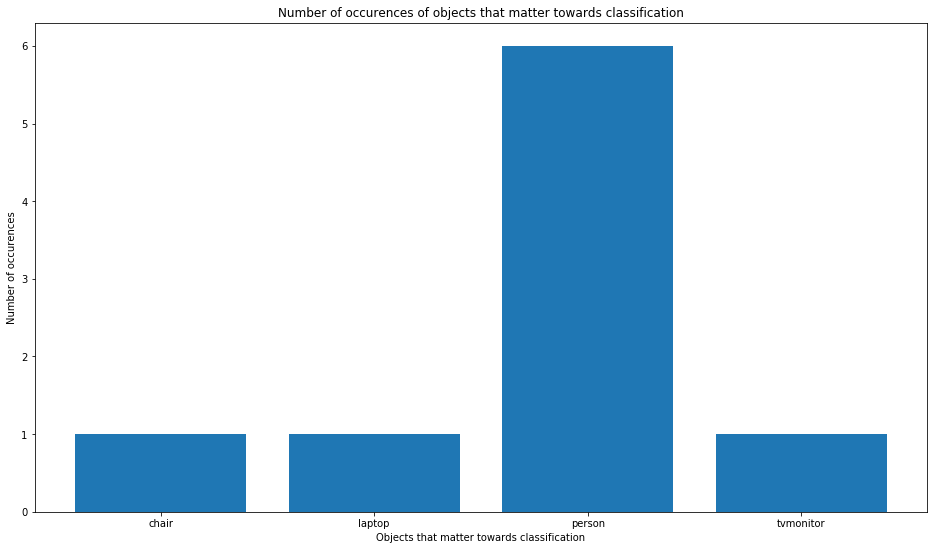

In [86]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
plt.rcParams["figure.figsize"] = [16,9]

ax = plt.figure().gca()
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
y = np.array(plot_objects_nurse)


labels, counts = np.unique(plot_objects_nurse, return_counts=True)
plt.bar(labels, counts, align='center')
plt.gca().set_xticks(labels)



plt.title('Number of occurences of objects that matter towards classification')
plt.xlabel('Objects that matter towards classification')
plt.ylabel('Number of occurences')


plt.show()

In [ ]:
############## BLURRING ###############

In [ ]:
path = os.path.abspath("exp/in_images")
path

In [ ]:
for image_path in os.listdir(path):
    if (image_path == path + '.DS_Store'):
        continue 
    input_path = os.path.join(path, image_path)
    if (image_path != ".DS_Store"):
        for i in range(len(nurse_corpus_objects_matter)):
            if(os.path.relpath(input_path)==nurse_corpus_objects_matter[i][0]):
                image=Image.open(nurse_corpus_objects_matter[i][0])
                cropped_image=image.crop((nurse_corpus_objects_matter[i][2],nurse_corpus_objects_matter[i][3],nurse_corpus_objects_matter[i][4],nurse_corpus_objects_matter[i][5]))
                blurred_image=cropped_image.filter(ImageFilter.GaussianBlur(radius=4))
                image.paste(blurred_image,(nurse_corpus_objects_matter[i][2],nurse_corpus_objects_matter[i][3],nurse_corpus_objects_matter[i][4],nurse_corpus_objects_matter[i][5]))
                image.save('exp/blurred/Image'+str(i)+'.jpg')

In [ ]:
############### CLASSIFICATION AFTER BLURRING ###############

In [ ]:
# Load data for test after blurring
data_transforms = {
    'train': transforms.Compose([transforms.Resize(224), transforms.RandomCrop(224), transforms.RandomHorizontalFlip(), transforms.ToTensor(), transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])]),
    'test': transforms.Compose([transforms.Resize(224), transforms.CenterCrop(224), transforms.ToTensor(), transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
}

data_dir = 'data_after_blurring'

# Create dataset class 
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),data_transforms[x]) for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'test']}
# Obtain dataset sizes for training and validation set
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
# Obtain class names
class_names = image_datasets['train'].classes

use_gpu = torch.cuda.is_available()

In [ ]:
print(dataset_sizes, class_names)
print(image_datasets)

In [ ]:
label = []
predictions = []
merged_probs = []
images = []

for i, data in enumerate(dataloaders['test']):
    inputs, labels = data
    if use_gpu:
        inputs, labels = Variable(inputs.cuda()), Variable(labels.cuda())
    else:
        inputs, labels = Variable(inputs), Variable(labels)
        
    outputs = model_conv(inputs)
    # Activation and prediction for each image 
    _, preds = torch.max(outputs.data, 1)
    
    # Extract labels into a list
    labels = labels.data.cpu().numpy()
    label.append(labels)
    merged_labels = np.array(list(itertools.chain(*label)))
    
    # Extract predictions into a list
    preds = preds.numpy()
    predictions.append(preds)
    merged_preds = np.array(list(itertools.chain(*predictions)))
                           
    # Extract probabilities into a list
    x = torch.nn.functional.softmax(outputs)
    probs = x.data.cpu().numpy()
    for batch in probs:
        merged_probs.append(max(batch))
    
    # Extract dataset of images in Tensor format
    inputs = inputs.data.cpu().numpy()
    images.append(inputs)
    merged_ds = np.array(list(itertools.chain(*images)))

In [ ]:
plot_val_with_title(most_by_correct(1, True), 'Correct nurse (all)')

In [ ]:
np.count_nonzero((merged_preds == merged_labels)==False)

In [ ]:
plot_val_with_title(most_by_correct(1, False), 'Incorrect nurse (all)')

In [ ]:
most_uncertain = np.argsort(np.array(merged_probs))[:4]
plot_val_with_title(most_uncertain, "Most uncertain predictions")

In [ ]:
plt.figure(figsize=(8,6))
plt.bar('Doctor', height=88.8, width=0.5)
plt.bar('Nurse', height=91.1, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance on Validation Set(by Class)', fontsize=20)

In [ ]:
plt.figure(figsize=(8,6))
plt.bar('Doctor', height=88, width=0.5)
plt.bar('Nurse', height=83, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance on Test Set(by Class)', fontsize=20)

In [ ]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=88.8, width=0.5)
plt.bar('Female', height=93.3, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Validation Set(Nurse Class)', fontsize=20)

In [ ]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=86, width=0.5)
plt.bar('Female', height=80, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Test Set(Nurse Class)', fontsize=20)

In [ ]:
plt.figure(figsize=(8,6))
plt.bar('Male', height=87.3, width=0.5)
plt.bar('Female', height=86.7, width=0.5)

plt.ylabel('Accuracy(%)', fontsize=12)
plt.ylim(0,100)
plt.title('Prediction Performance per Gender on Validation and Test Set(Nurse Class)', fontsize=20)